In [9]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [10]:
!cp -r "/content/gdrive/MyDrive/khodar/f&v2" "/content/"



#KHODAR

In [7]:
import glob
import os.path as osp
import random
import numpy as np
import json
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision
from torchvision import models, transforms

In [ ]:
# # setting random number seed.
# torch.manual_seed(1234)
# np.random.seed(1234)
# random.seed(1234)

# # preprocess class for each image
# class ImageTransform():

#     def __init__(self, size, mean, std):
#         self.data_transform = {
#             'train': transforms.Compose([
#                 # data augmentation
#                 transforms.RandomResizedCrop(size, scale=(0.5, 1.0)),
#                 transforms.RandomHorizontalFlip(),
#                 # convert to tensor for PyTorch
#                 transforms.ToTensor(),
#                 # color normalization
#                 transforms.Normalize(mean, std)
#             ]),
#             'validation': transforms.Compose([
#                 transforms.CenterCrop(size),
#                 transforms.ToTensor(),
#                 transforms.Normalize(mean, std)
#             ])
#         }

#     def __call__(self, img, phase='train'):

#         return self.data_transform[phase](img)

In [6]:
# better image transfromation

class ImageTransform():

    def __init__(self, size, mean, std):
        self.data_transform = {
            'train': transforms.Compose([
                transforms.RandomResizedCrop(size, scale=(0.5, 1.0)),
                transforms.RandomHorizontalFlip(),
                transforms.RandomRotation(10),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
                transforms.RandomCrop(size),
                transforms.ToTensor(),
                transforms.Normalize(mean, std)
            ]),
            'validation': transforms.Compose([
                transforms.CenterCrop(size),
                transforms.ToTensor(),
                transforms.Normalize(mean, std)
            ])
        }

    def __call__(self, img, phase='train'):
        return self.data_transform[phase](img)


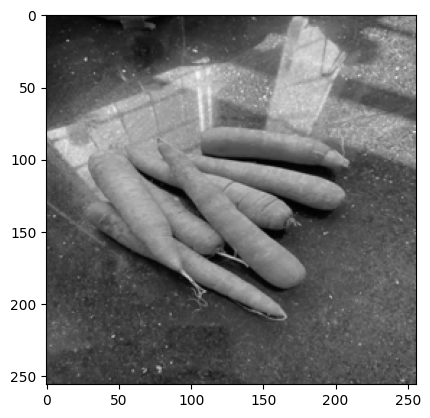

torch.Size([3, 256, 256])


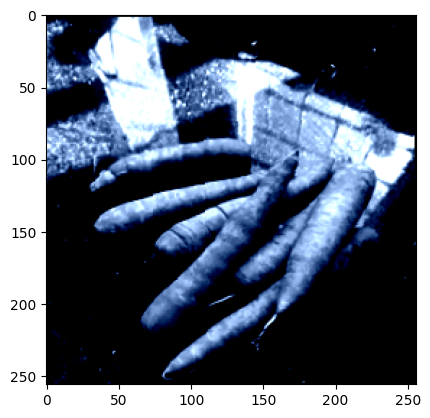

In [8]:
image_file_path = '/content/f&v2/test/Carrot/7E30603E-5345-4B42-8DE6-485489C719BC.JPG'

img_originalsize = Image.open(image_file_path) # [channel, ]
img = img_originalsize.resize((256, 256))
img = img.convert("L").convert("RGB")
plt.imshow(img)
plt.show()

# after preprocess
size = 256
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
transform = ImageTransform(size, mean, std)
img_transformed = transform(img, phase="train")
print (img_transformed.shape)

# (color, height, width) -> (height, width, color), normalize colors in the range (0 - 1)
img_transformed = img_transformed.numpy().transpose((1, 2, 0))
img_transformed = np.clip(img_transformed, 0, 1)
plt.imshow(img_transformed)
plt.show()


In [ ]:
# making file path list
def make_datapath_list(phase="train"):
    rootpath = "/content/f&v2"

    # Modify the target_path to include both .jpeg and .png files
    target_path = osp.join(rootpath, phase, '**', '*')
    print(target_path)

    path_list = []

    # Use glob.glob with the modified target_path
    for path in glob.glob(target_path):
        # Check if the file has a .jpeg or .png extension
        # if path.endswith('.jpg') or path.endswith('.png'):
          path_list.append(path)

    return path_list

train_list = make_datapath_list(phase="train")
print(len(train_list))

val_list = make_datapath_list(phase="validation")
print(len(val_list))

/content/f&v2/train/**/*
828
/content/f&v2/validation/**/*
197


In [ ]:
from torch.utils.data import DataLoader

class FruitsDataset(data.Dataset):


    class_to_idx = {'Artichoke': 0, 'Beet': 1, 'Carrot': 2, 'Cucumber': 3, 'Egg Plant': 4, 'HotPeeper': 5, 'Lemon': 6, 'Onion': 7, 'Oranges': 8, 'Pepper': 9, 'Potato': 10, 'Squach': 11, 'Tomato': 12, 'Turnip': 13}
    idx_to_class = {v: k for k, v in class_to_idx.items()}

    def __init__(self, file_list, transform=None, phase='train'):
        self.file_list = file_list
        self.transform = transform
        self.phase = phase

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, index):

        img_path = self.file_list[index]
        img_originalsize = Image.open(img_path)
        img = img_originalsize.resize((256, 256))
        img = img.convert("L").convert("RGB")
        img_transformed = self.transform(img, self.phase)
        label = img_path.split('/')[-2]
        label_idx = self.class_to_idx[label]

        return img_transformed, label_idx

train_dataset = FruitsDataset(file_list=train_list, transform=ImageTransform(size, mean, std), phase='train')
val_dataset = FruitsDataset(file_list=val_list, transform=ImageTransform(size, mean, std), phase='validation')


In [ ]:
batch_size = 32


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
dataloaders_dict = {"train": train_loader, "validation": val_loader}

In [ ]:
use_pretrained = True
net = models.vgg16(pretrained=use_pretrained)

net.classifier[6] = nn.Linear(in_features=4096, out_features=14)
net.train()

In [ ]:
criterion = nn.CrossEntropyLoss()

update_param_names_1 = ["classifier.6.weight", "classifier.6.bias"] # Final layer
update_param_names_2 = ["classifier.0.weight", "classifier.0.bias", "classifier.3.weight", "classifier.3.bias"] # Some earlier layers

params_to_update_1 = []
params_to_update_2 = []

for name, param in net.named_parameters():
    if name in update_param_names_1:
        param.requires_grad = True
        params_to_update_1.append(param)
    elif name in update_param_names_2:
        param.requires_grad = True
        params_to_update_2.append(param)
    else:
        param.requires_grad = False

# Set learning rates for different groups of parameters
optimizer = optim.SGD([
    {'params': params_to_update_1, 'lr': 1e-3}, # Higher learning rate for the final layer
    {'params': params_to_update_2, 'lr': 1e-4} # Lower learning rate for earlier layers
], momentum=0.9)

In [ ]:
print(dataloaders_dict.keys())


dict_keys(['train', 'validation'])


In [ ]:
# <<<<<<<<<<<<<<<<<to check overfitting>>>>>>>>>>>>>>>>>>>>>>

def train_model(net, dataloaders_dict, criterion, optimizer, num_epochs):

    train_accuracy_list = []
    train_loss_list = []
    val_accuracy_list = []
    val_loss_list = []

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print("using device:", device)
    net.to(device)
    torch.backends.cudnn.benchmark = True

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-------------')

        for phase in ['train', 'validation']:
            if phase == 'train':
                net.train()
            else:
                net.eval()

            epoch_loss = 0.0
            epoch_corrects = 0

            for i, (inputs, labels) in enumerate(dataloaders_dict[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = net(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                    epoch_loss += loss.item() * inputs.size(0)
                    epoch_corrects += torch.sum(preds == labels.data)

            epoch_loss = epoch_loss / len(dataloaders_dict[phase].dataset)
            epoch_acc = epoch_corrects.double() / len(dataloaders_dict[phase].dataset)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            if phase == 'train':
                train_loss_list.append(epoch_loss)
                train_accuracy_list.append(epoch_acc.item())
            else:
                val_loss_list.append(epoch_loss)
                val_accuracy_list.append(epoch_acc.item())

    return train_accuracy_list, train_loss_list, val_accuracy_list, val_loss_list


In [ ]:
# start training
num_epochs=20
t_accuracy_list, t_loss_list, v_accuracy_list, v_loss_list = train_model(net, dataloaders_dict, criterion, optimizer, num_epochs=num_epochs)

using device: cuda:0
Epoch 1/20
-------------
train Loss: 2.2968 Acc: 0.2814
validation Loss: 1.4973 Acc: 0.6193
Epoch 2/20
-------------
train Loss: 1.2942 Acc: 0.6812
validation Loss: 0.8992 Acc: 0.7716
Epoch 3/20
-------------
train Loss: 0.9253 Acc: 0.7705
validation Loss: 0.6701 Acc: 0.8325
Epoch 4/20
-------------
train Loss: 0.7790 Acc: 0.7911
validation Loss: 0.5921 Acc: 0.8223
Epoch 5/20
-------------
train Loss: 0.6655 Acc: 0.8237
validation Loss: 0.4966 Acc: 0.8477
Epoch 6/20
-------------
train Loss: 0.5699 Acc: 0.8551
validation Loss: 0.4420 Acc: 0.8832
Epoch 7/20
-------------
train Loss: 0.5299 Acc: 0.8563
validation Loss: 0.4327 Acc: 0.8731
Epoch 8/20
-------------
train Loss: 0.5040 Acc: 0.8599
validation Loss: 0.3798 Acc: 0.9086
Epoch 9/20
-------------
train Loss: 0.5107 Acc: 0.8563
validation Loss: 0.3581 Acc: 0.9036
Epoch 10/20
-------------
train Loss: 0.4629 Acc: 0.8647
validation Loss: 0.3386 Acc: 0.9086
Epoch 11/20
-------------
train Loss: 0.4326 Acc: 0.8780
v

In [ ]:
# To save trained model
save_path = './weights_fine_tuning.pth'
torch.save(net.state_dict(), save_path)


In [ ]:
import os
import glob
import random

# Path to the validation folder
validation_folder = '/content/f&v2/validation'

# List all subfolders (each representing a category)
categories = [category for category in os.listdir(validation_folder) if os.path.isdir(os.path.join(validation_folder, category))]

# Select 10 random categories
selected_categories = random.sample(categories, 13)

# List of image paths for each selected category
selected_image_paths = []
for category in selected_categories:
    category_folder = os.path.join(validation_folder, category)
    # List all image files in the category folder
    image_paths = glob.glob(category_folder + '/*.jpg')
    # Select up to 5 random images from the category
    selected_image_paths.extend(random.sample(image_paths, min(5, len(image_paths))))

# Show images with predictions



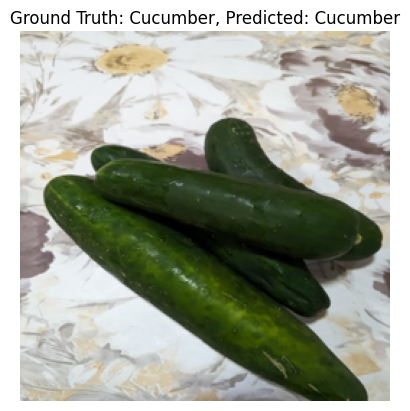

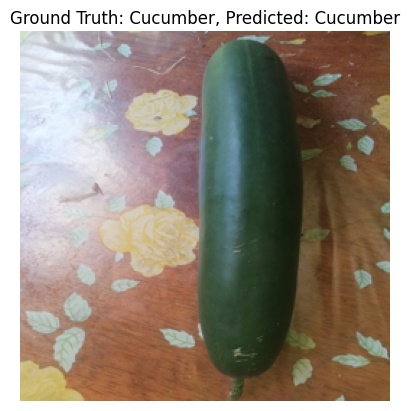

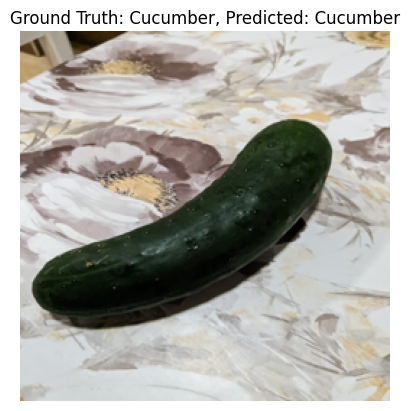

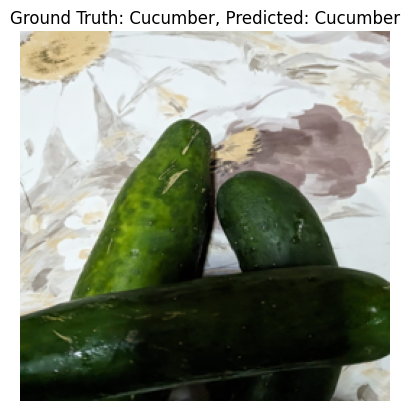

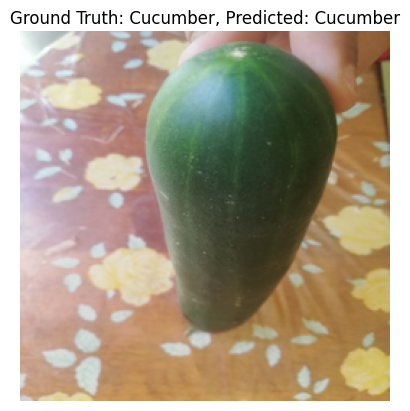

...

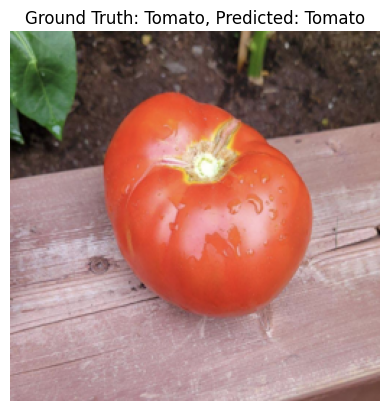

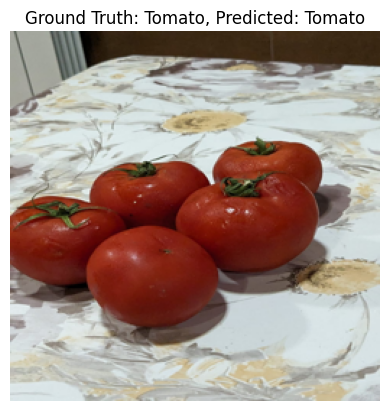

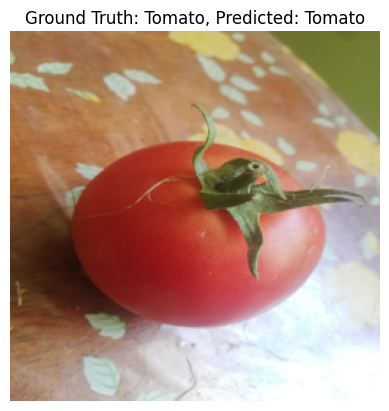

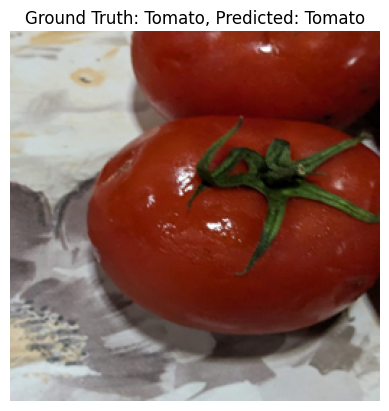

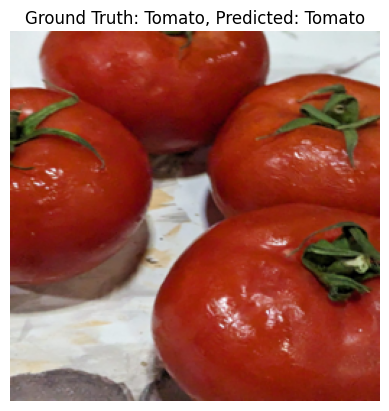

In [ ]:
def show_image_prediction(image_path, model, transform, dataset, device='cuda'):
    # Load and preprocess the image
    img_originalsize = Image.open(image_path)
    img = img_originalsize.resize((256, 256))
    img_ = img.convert("L").convert("RGB")
    img_transformed = transform(img_, phase="validation")
    img_tensor = img_transformed.unsqueeze(0).to(device)  # Add batch dimension and move to device

    # Move model to the same device as the input tensor
    model.to(device)

    # Perform prediction
    model.eval()
    with torch.no_grad():
        outputs = model(img_tensor)
    _, preds = torch.max(outputs, 1)
    predicted_label = dataset.idx_to_class[preds.item()]

    # Extract the ground truth label from the image path
    ground_truth_label = image_path.split('/')[-2]

    # Display the image along with ground truth and predicted labels
    plt.imshow(img)
    plt.title(f"Ground Truth: {ground_truth_label}, Predicted: {predicted_label}")
    plt.axis('off')
    plt.show()

# Show images with predictions
for image_path in selected_image_paths:
    show_image_prediction(image_path, net, transform, train_dataset)


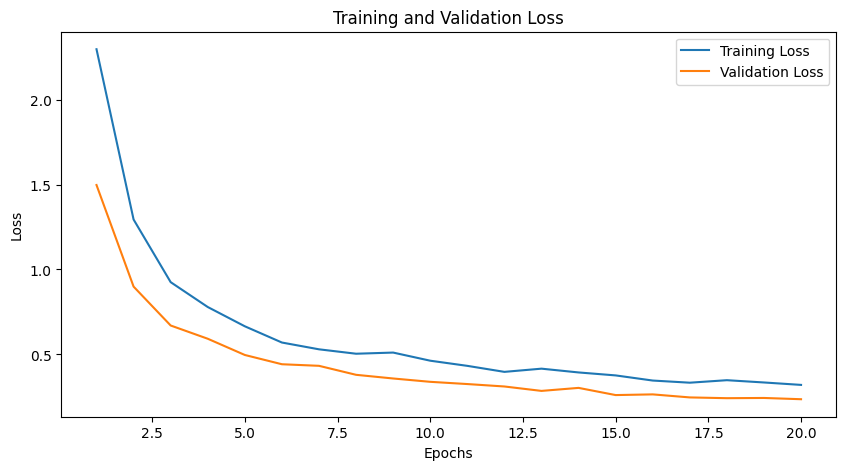

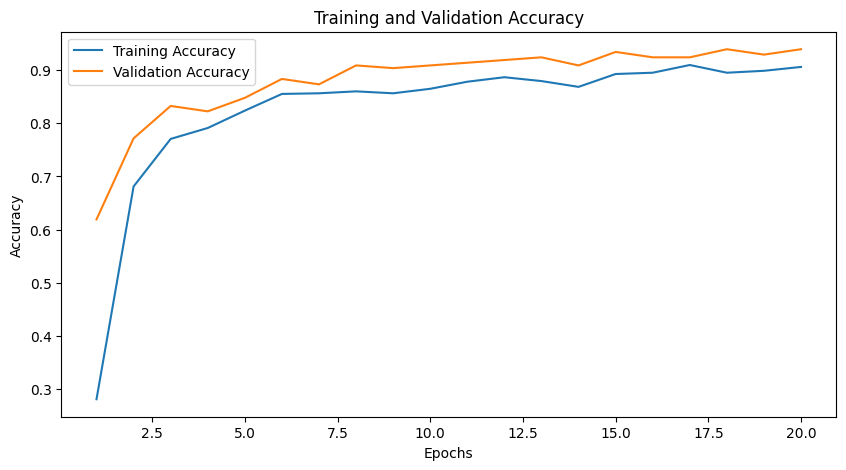

In [ ]:
import matplotlib.pyplot as plt

# Plotting training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), t_loss_list, label='Training Loss')
plt.plot(range(1, num_epochs+1), v_loss_list, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plotting training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), t_accuracy_list, label='Training Accuracy')
plt.plot(range(1, num_epochs+1), v_accuracy_list, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()
